In [1]:
%matplotlib inline

from astropy.io import fits
import matplotlib
from matplotlib import pyplot as plt
import numpy as np
from scipy.signal import find_peaks

from rascal.calibrator import Calibrator
from rascal.util import refine_peaks

C:\Users\cylam\git\rascal\src\rascal\calibrator.py:9: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


Info: https://www.eso.org/sci/facilities/lasilla/instruments/efosc/inst/Perf_HeAr.html

Manual: https://www.eso.org/sci/facilities/lasilla/instruments/efosc/doc/manual/EFOSC2manual_v4.2.pdf

Grism #11

In [2]:
data = fits.open('data_eso36_efosc/EFOSC_spec_HeAr227_0005.fits')[0]

C:\Users\cylam\AppData\Local\Temp\ipykernel_8612\4101913083.py:2: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(data.data.T), aspect='auto', origin='lower')


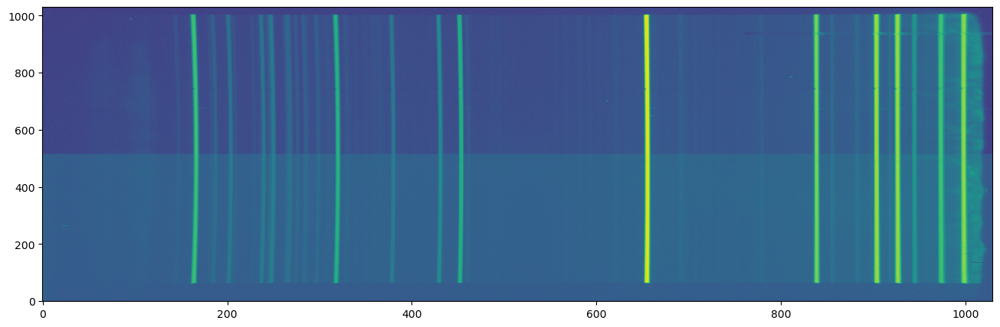

In [3]:
plt.figure(1, figsize=(16,5))
plt.imshow(np.log(data.data.T), aspect='auto', origin='lower')

In [4]:
spectrum = np.median(data.data.T, axis=0)

# Identify the arc lines
peaks, _ = find_peaks(spectrum, prominence=200, distance=10, threshold=None)
peaks_refined = refine_peaks(spectrum, peaks, window_width=3)

[Wed, 11 Jan 2023 16:50:33] INFO [calibrator.py:997] num_pix is set to 1030.
[Wed, 11 Jan 2023 16:50:33] INFO [calibrator.py:1012] pixel_list is set to None.
[Wed, 11 Jan 2023 16:50:33] INFO [calibrator.py:1045] Plotting with matplotlib.


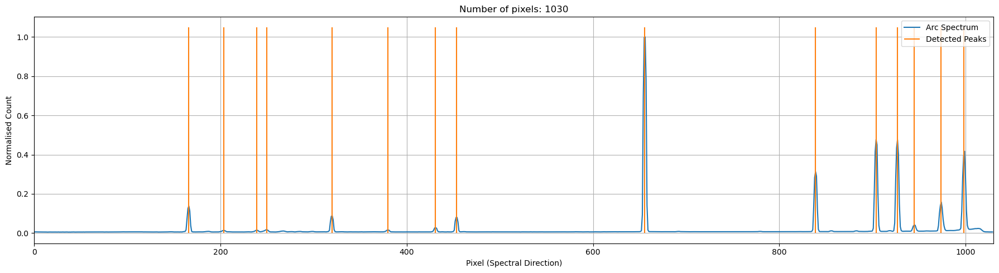

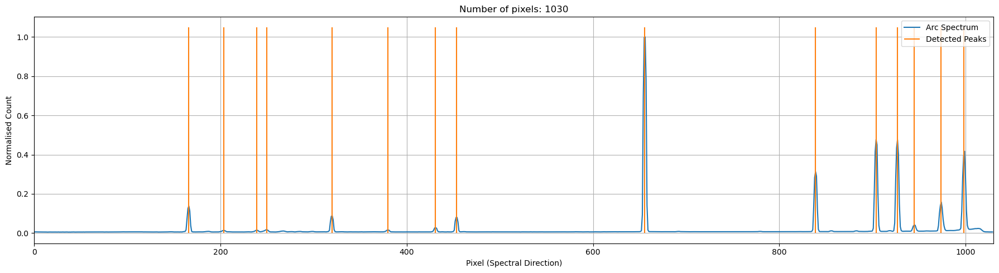

In [5]:

c = Calibrator(peaks_refined, spectrum)
c.set_calibrator_properties(num_pix=len(spectrum),
                            plotting_library='matplotlib',
                            log_level='info')

c.plot_arc()

In [6]:
c.use_plotly()
c.plot_arc(renderer='notebook')
c.use_matplotlib()

In [7]:
c.set_known_pairs(238.8349, 4158.6)
c.set_known_pairs(249.4005, 4200.7)
c.set_known_pairs(319.584, 4471.5)
c.set_known_pairs(904.0698, 6965.324918928855)
c.set_known_pairs(926.8235, 7067.11099376977)

#c.set_known_pairs(655.0, 5875.56)
c.set_hough_properties(num_slopes=2000,
                       range_tolerance=200.,
                       xbins=200,
                       ybins=200,
                       min_wavelength=3200.,
                       max_wavelength=7500.)
c.set_ransac_properties(sample_size=5, top_n_candidate=5, minimum_matches=4)
c.add_atlas(["He"], temperature=280.0)
c.add_atlas(["Ar"], min_intensity=200, temperature=280.0)
c.do_hough_transform()

[Wed, 11 Jan 2023 16:50:35] WARNING [calibrator.py:1428] Using add_atlas is now deprecated. Please use the new Atlas class.
[Wed, 11 Jan 2023 16:50:35] WARNING [calibrator.py:1428] Using add_atlas is now deprecated. Please use the new Atlas class.


  0%|          | 0/5000 [00:00<?, ?it/s]

[Wed, 11 Jan 2023 16:50:48] INFO [calibrator.py:803] Found: 12
[Wed, 11 Jan 2023 16:50:48] INFO [plotting.py:845] Peak at: 3888.6158784885465 A
[Wed, 11 Jan 2023 16:50:48] INFO [plotting.py:849] - matched to 3888.6158784885465 A
[Wed, 11 Jan 2023 16:50:48] INFO [plotting.py:845] Peak at: 4158.555259353236 A
[Wed, 11 Jan 2023 16:50:48] INFO [plotting.py:849] - matched to 4158.555259353236 A
[Wed, 11 Jan 2023 16:50:48] INFO [plotting.py:845] Peak at: 4200.639895488837 A
[Wed, 11 Jan 2023 16:50:48] INFO [plotting.py:849] - matched to 4200.639895488837 A
[Wed, 11 Jan 2023 16:50:48] INFO [plotting.py:845] Peak at: 4471.443541945875 A
[Wed, 11 Jan 2023 16:50:48] INFO [plotting.py:849] - matched to 4471.443541945875 A
[Wed, 11 Jan 2023 16:50:48] INFO [plotting.py:845] Peak at: 4713.107192022088 A
[Wed, 11 Jan 2023 16:50:48] INFO [plotting.py:849] - matched to 4713.107192022088 A
[Wed, 11 Jan 2023 16:50:48] INFO [plotting.py:845] Peak at: 4921.891105284185 A
[Wed, 11 Jan 2023 16:50:48] INFO [p

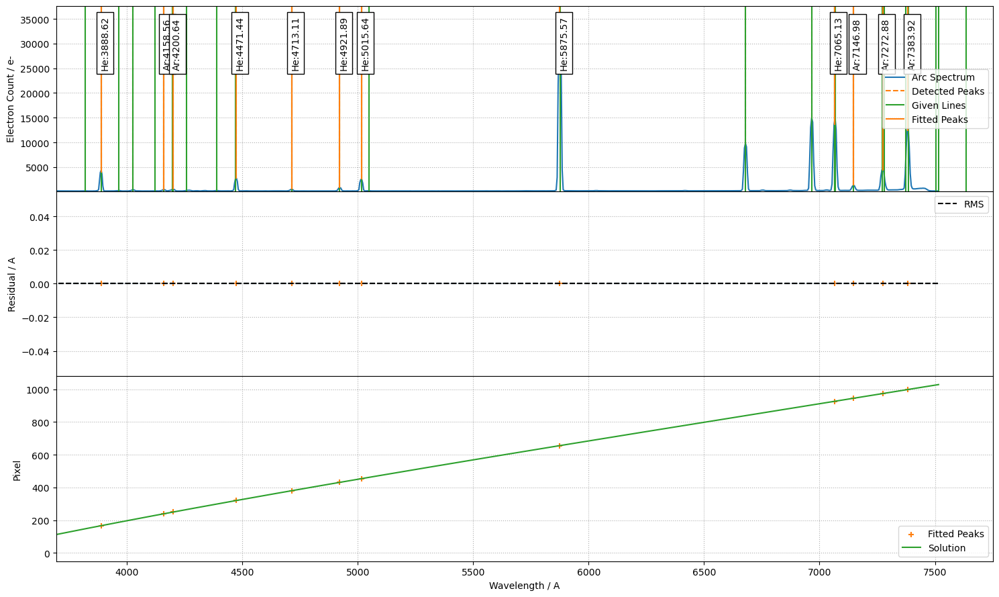

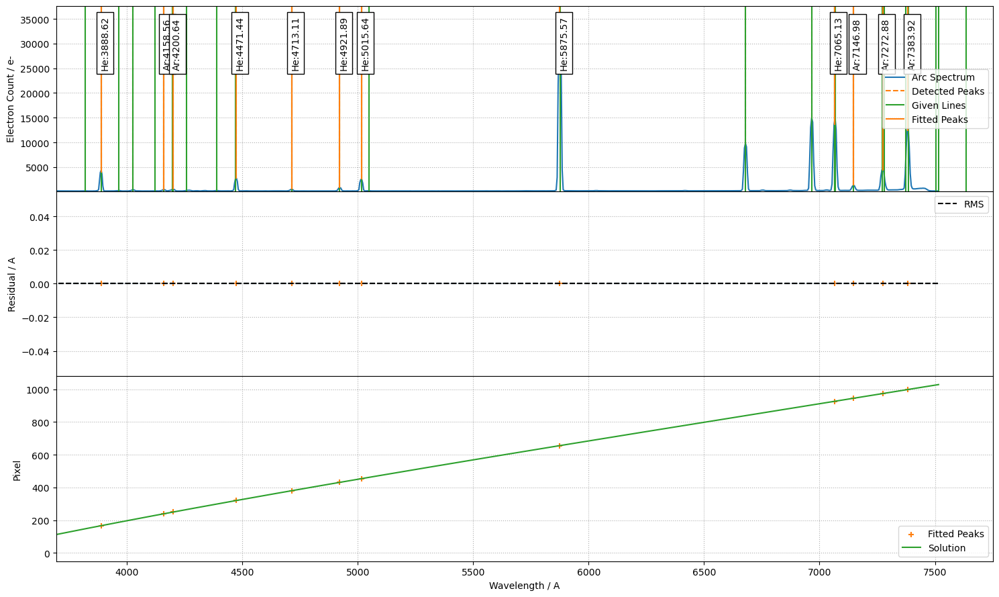

In [8]:
# Run the wavelength calibration
(best_p, matched_peaks, matched_atlas, rms, residual, peak_utilisation,
 atlas_utilisation) = c.fit(max_tries=5000, fit_deg=3, candidate_tolerance=5.0)

c.plot_fit(best_p, plot_atlas=True, log_spectrum=False, tolerance=10.0)

In [9]:
c.use_plotly()
c.plot_fit(best_p, plot_atlas=True, log_spectrum=False, tolerance=10.0, renderer='notebook')
c.use_matplotlib()

[Wed, 11 Jan 2023 16:50:50] INFO [plotting.py:1020] Peak at: 3887.7027376628603 A
[Wed, 11 Jan 2023 16:50:50] INFO [plotting.py:1030] - matched to 3888.6158784885465 A
[Wed, 11 Jan 2023 16:50:50] INFO [plotting.py:1020] Peak at: 4026.7030604008546 A
[Wed, 11 Jan 2023 16:50:50] INFO [plotting.py:1030] - matched to 4026.1581385611394 A
[Wed, 11 Jan 2023 16:50:50] INFO [plotting.py:1020] Peak at: 4159.831425628122 A
[Wed, 11 Jan 2023 16:50:50] INFO [plotting.py:1030] - matched to 4158.555259353236 A
[Wed, 11 Jan 2023 16:50:50] INFO [plotting.py:1020] Peak at: 4200.089676323663 A
[Wed, 11 Jan 2023 16:50:50] INFO [plotting.py:1030] - matched to 4200.639895488837 A
[Wed, 11 Jan 2023 16:50:50] INFO [plotting.py:1020] Peak at: 4472.733893432208 A
[Wed, 11 Jan 2023 16:50:50] INFO [plotting.py:1030] - matched to 4471.443541945875 A
[Wed, 11 Jan 2023 16:50:50] INFO [plotting.py:1020] Peak at: 4712.964228518367 A
[Wed, 11 Jan 2023 16:50:50] INFO [plotting.py:1030] - matched to 4713.107192022088 A


In [10]:
c.atlas.list()

Element He at 5875.572928138113 with intensity 500.0
Element He at 3888.6158784885465 with intensity 500.0
Element He at 4471.443541945875 with intensity 200.0
Element He at 7065.132975916987 with intensity 200.0
Element He at 6678.097204223339 with intensity 100.0
Element He at 5015.637369469053 with intensity 100.0
Element He at 4026.1581385611394 with intensity 50.0
Element He at 7281.2900229404395 with intensity 50.0
Element He at 3013.6962938585243 with intensity 40.0
Element He at 4713.107192022088 with intensity 30.0
Element He at 7065.654831230155 with intensity 30.0
Element He at 4921.891105284185 with intensity 20.0
Element He at 3964.696362247084 with intensity 20.0
Element He at 3187.718318195826 with intensity 20.0
Element He at 4120.781450153762 with intensity 12.0
Element He at 4387.893613229967 with intensity 10.0
Element He at 5047.696396294571 with intensity 10.0
Element He at 3819.5757669890377 with intensity 10.0
Element Ar at 7635.044816789795 with intensity 25000.

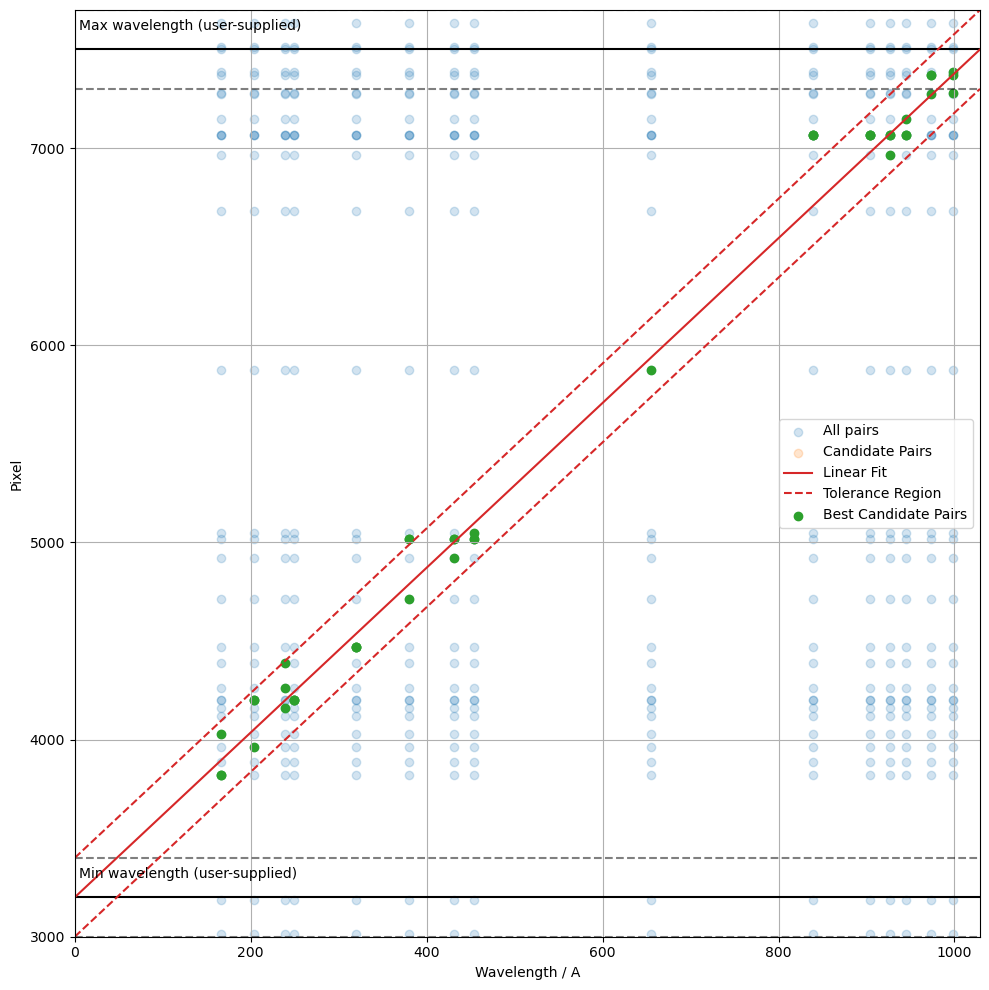

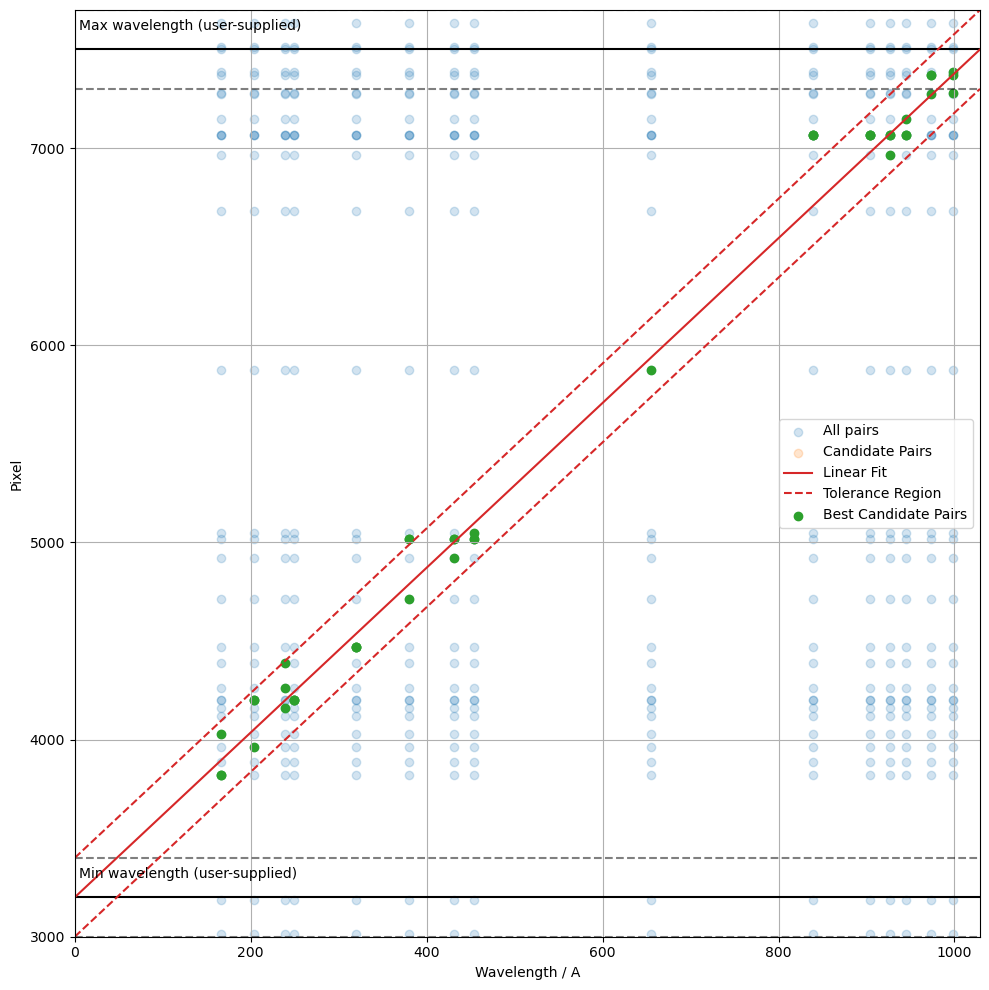

In [11]:
c.plot_search_space()

In [12]:
c.use_plotly()
c.plot_search_space(renderer='notebook')

In [13]:
print("Stdev error: {} A".format(np.abs(residual).std()))
print("Peaks utilisation rate: {}%".format(peak_utilisation * 100))
print("Atlas utilisation rate: {}%".format(atlas_utilisation * 100))

Stdev error: 0.5060835202842227 A
Peaks utilisation rate: 80.0%
Atlas utilisation rate: 38.70967741935484%
